In [1]:
import os
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import seaborn as sns

from scipy import sparse
from scipy.spatial.distance import cdist
from scipy.interpolate import UnivariateSpline
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import normalize
from tqdm import tqdm

sc.set_figure_params(figsize=(6, 6), dpi=100, frameon=False)
pd.set_option("display.max_rows", 80)
pd.set_option("display.max_columns", 80)

In [2]:
INFILE = "workspace/hpca/hpca_downstream/julia_concat_objects_new/GSE167880_core_2705.h5ad"
OUTDIR = "workspace/hpca/hpca_downstream/HSC_Islets_Results/"
os.makedirs(OUTDIR, exist_ok=True)

SOURCE_COL = "source"
STATE_COL = "Level_4_extension"
STAGE_COL = "Stage"
CORE_LABEL = "core"
QUERY_LABEL = "GSE167880_extension"
REP_KEY = "X_scvi"
PATIENT_COL = "Dataset_ID"

STAGE_ORDER = [
    "Stage5", "Week0", "Week3", "Week6",
    "Month1", "Month3", "Month6_CTRL", "Month6_STZ",
]

SPLINE_STAGES = [
    "Stage5", "Week0", "Week3", "Week6",
    "Month1", "Month3", "Month6_CTRL",
]

MATURE_BETA_STATES = [
    "Beta Cell: INS_High",
    "Beta Cell: Mature Identity",
    "Beta Cell: Secretory Granules",
]

STRESS_BETA_STATES = [
    "Beta Cell: ER Stress",
    "Beta Cell: Oxidative Stress",
    "Beta Cell: Dedifferentiation-like",
    "Beta Cell: Interferon Response",
]

DROP_PREFIXES = ("RPS", "RPL", "MT-", "MT.", "HB")

In [3]:


def get_X_dense_or_sparse(hsc_islets, layer=None):
    if layer is not None and layer in hsc_islets.layers:
        return hsc_islets.layers[layer]
    return hsc_islets.X


def mean_expr(hsc_islets, genes, layer=None):
    X = hsc_islets[:, genes].layers[layer] if layer and layer in hsc_islets.layers else hsc_islets[:, genes].X
    if sparse.issparse(X):
        return np.asarray(X.mean(axis=0)).ravel()
    return np.asarray(X.mean(axis=0)).ravel()


def expr_frac(hsc_islets, genes, layer=None):
    X = hsc_islets[:, genes].layers[layer] if layer and layer in hsc_islets.layers else hsc_islets[:, genes].X
    if sparse.issparse(X):
        return np.asarray((X > 0).mean(axis=0)).ravel()
    return np.asarray((X > 0).mean(axis=0)).ravel()


def remove_bad_genes(hsc_islets):
    bad = hsc_islets.var_names[
        hsc_islets.var_names.str.upper().str.startswith(DROP_PREFIXES)
    ]
    return hsc_islets[:, ~hsc_islets.var_names.isin(bad)].copy()


def compute_humanness_score(
    hsc_islets_combined,
    sc_source_label=QUERY_LABEL,
    human_source_label=CORE_LABEL,
    source_col=SOURCE_COL,
    atlas_state_col=STATE_COL,
    rep_key=REP_KEY,
    n_neighbors=50,
    distance_epsilon=1e-6,
):
    human_mask = hsc_islets_combined.obs[source_col] == human_source_label
    sc_mask = hsc_islets_combined.obs[source_col] == sc_source_label

    human_hsc_islets = hsc_islets_combined[human_mask]
    sc_hsc_islets = hsc_islets_combined[sc_mask]

    X_ref = normalize(human_hsc_islets.obsm[rep_key].astype(np.float32))
    X_query = normalize(sc_hsc_islets.obsm[rep_key].astype(np.float32))

    human_states_raw = human_hsc_islets.obs[atlas_state_col].astype(str).values
    unique_states, state_codes = np.unique(human_states_raw, return_inverse=True)

    n_states = len(unique_states)
    log2_n_states = np.log2(n_states) if n_states > 1 else 1.0

    nn = NearestNeighbors(
        n_neighbors=n_neighbors,
        metric="cosine",
        algorithm="brute",
        n_jobs=-1,
    )
    nn.fit(X_ref)
    distances, indices = nn.kneighbors(X_query)

    weights = 1.0 / (distances + distance_epsilon)
    neigh_codes = state_codes[indices]

    n_sc = X_query.shape[0]

    flat_idx = (
        np.repeat(np.arange(n_sc), n_neighbors) * n_states
        + neigh_codes.ravel()
    )

    state_weight_matrix = np.zeros(n_sc * n_states, dtype=np.float64)
    np.add.at(state_weight_matrix, flat_idx, weights.ravel())
    state_weight_matrix = state_weight_matrix.reshape(n_sc, n_states)

    row_sums = state_weight_matrix.sum(axis=1, keepdims=True)
    probs = state_weight_matrix / np.where(row_sums == 0, 1.0, row_sums)

    with np.errstate(divide="ignore", invalid="ignore"):
        log_probs = np.where(probs > 0, np.log2(probs), 0.0)

    H = -np.sum(probs * log_probs, axis=1) / log2_n_states
    H += 0.0

    dominant_idx = np.argmax(probs, axis=1)
    dominant_state = unique_states[dominant_idx]
    dominant_weight = probs[np.arange(n_sc), dominant_idx]
    n_unique = (probs > 0).sum(axis=1).astype(int)

    return pd.DataFrame(
        {
            "weighted_entropy": H,
            "dominant_human_state": dominant_state,
            "dominant_weight": dominant_weight,
            "n_unique_states": n_unique,
        },
        index=sc_hsc_islets.obs_names,
    )


def match_states(all_states, include, exclude=None):
    if isinstance(include, str):
        include = [include]
    if exclude is None:
        exclude = []
    if isinstance(exclude, str):
        exclude = [exclude]

    out = []
    for s in all_states:
        s_low = s.lower()
        keep = any(x.lower() in s_low for x in include)
        drop = any(x.lower() in s_low for x in exclude)
        if keep and not drop:
            out.append(s)
    return out


def trimmed_centroid(hsc_islets_sub, expr_gene="INS", top_frac=0.05, rep_key=REP_KEY):
    if expr_gene in hsc_islets_sub.var_names:
        gene_idx = hsc_islets_sub.var_names.get_loc(expr_gene)
        X = hsc_islets_sub.X
        expr = np.asarray(X[:, gene_idx].toarray()).ravel() if sparse.issparse(X) else np.asarray(X[:, gene_idx]).ravel()
        threshold = np.quantile(expr, 1 - top_frac)
        top_mask = expr >= threshold
        return hsc_islets_sub.obsm[rep_key][top_mask].mean(axis=0)
    return np.median(hsc_islets_sub.obsm[rep_key], axis=0)


def bootstrap_median_dist(coords, centroid, n_boot=500, seed=42):
    rng = np.random.default_rng(seed)
    n = len(coords)
    medians = []
    for _ in range(n_boot):
        idx = rng.integers(0, n, n)
        medians.append(np.median(cdist(coords[idx], centroid[None, :], metric="cosine")))
    return np.percentile(medians, [2.5, 97.5])


In [4]:

hsc_islets = sc.read_h5ad(INFILE)

print(hsc_islets)
print(hsc_islets.obs[SOURCE_COL].value_counts())

hsc_islets.obs[PATIENT_COL] = (
    hsc_islets.obs["Dataset"].astype(str)
    + " : "
    + hsc_islets.obs["donor_id"].astype(str)
)

AnnData object with n_obs × n_vars = 883389 × 25785
    obs: 'barcode', 'Dataset', 'ID', 'sample_id', 'donor_id', 'alignment_software', 'assay_ontology_term_id', 'institute', 'library_id', 'library_preparation_batch', 'library_sequencing_run', 'Manual_Annotation', 'cell_enrichment', 'condition', 'celltype_all', 'manner_of_death', 'reference_genome', 'sample_collection_method', 'sample_source', 'sampled_site_condition', 'samples', 'sex', 'sex--cell_ontology_term_id', 'suspension_type', 'technology', 'tissue_type', 'assay', 'tissue', 'organism', 'disease', 'gene_annotation_version', 'batch_covar_split', 'batch_covar_split_donor_id', 'batch_covariate', 'info_batch_covariate_split', 'doublet_score', 'predicted_doublet', 'n_genes', 'total_counts', 'total_counts_mito', 'total_counts_ribo', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'n_genes_by_counts', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_

In [5]:
# Load original object
hsc_islets_qc = sc.read_h5ad('/workspace/hpca/data/Human_Stem_Cell_Derived_Islets/GSE167880/GSE167880_sc_islets_qc.h5ad')

In [6]:
# Remove cells from hsc_islets where Dataset == 'GSE167880' and their index is not in hsc_islets_qc
gse167880_mask = (hsc_islets.obs['Dataset'] == 'GSE167880')
cells_to_keep = hsc_islets_qc.obs_names
cells_to_drop = hsc_islets.obs_names[gse167880_mask & ~hsc_islets.obs_names.isin(cells_to_keep)]
len(cells_to_drop)

24473

In [7]:
(gse167880_mask.sum() - len(cells_to_drop)) == hsc_islets_qc.n_obs

np.True_

In [8]:
hsc_islets = hsc_islets[~hsc_islets.obs_names.isin(cells_to_drop)].copy()

In [9]:
for col in ["Stage", "Sample_ID"]:
    hsc_islets.obs[col] = hsc_islets.obs[col].astype(str)
    mapping = hsc_islets_qc.obs[col].astype(str)
    hsc_islets.obs.loc[gse167880_mask, col] = hsc_islets.obs.loc[gse167880_mask].index.map(mapping.get).astype(str)

hsc_islets.obs['donor_id'] = hsc_islets.obs['donor_id'].astype(str)
hsc_islets.obs.loc[gse167880_mask, "donor_id"] = (
    hsc_islets.obs.loc[gse167880_mask, "Sample_ID"].astype(str)
)

In [10]:
hsc_islets.obs.source.value_counts()

source
core                   815126
GSE167880_extension     43790
Name: count, dtype: int64

In [11]:
hsc_islets.obs.Stage.value_counts()

Stage
nan            815126
Week0           11148
Week3           10181
Month3           6358
Week6            4535
Month1           3788
Month6_STZ       2858
Stage5           2743
Month6_CTRL      2179
Name: count, dtype: int64

In [12]:
hsc_islets

AnnData object with n_obs × n_vars = 858916 × 25785
    obs: 'barcode', 'Dataset', 'ID', 'sample_id', 'donor_id', 'alignment_software', 'assay_ontology_term_id', 'institute', 'library_id', 'library_preparation_batch', 'library_sequencing_run', 'Manual_Annotation', 'cell_enrichment', 'condition', 'celltype_all', 'manner_of_death', 'reference_genome', 'sample_collection_method', 'sample_source', 'sampled_site_condition', 'samples', 'sex', 'sex--cell_ontology_term_id', 'suspension_type', 'technology', 'tissue_type', 'assay', 'tissue', 'organism', 'disease', 'gene_annotation_version', 'batch_covar_split', 'batch_covar_split_donor_id', 'batch_covariate', 'info_batch_covariate_split', 'doublet_score', 'predicted_doublet', 'n_genes', 'total_counts', 'total_counts_mito', 'total_counts_ribo', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'n_genes_by_counts', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_

In [13]:
sc.pp.neighbors(hsc_islets, use_rep=REP_KEY, n_neighbors=100, metric="cosine")
sc.tl.umap(hsc_islets)

In [14]:
hsc_islets.obs['Dataset_Source'] = hsc_islets.obs['Dataset'].astype(str) + '_' + hsc_islets.obs['source'].astype(str)

In [15]:
for dataset in hsc_islets.obs['Dataset_Source'].unique():
    print('-'*100)
    adata_subset = hsc_islets[hsc_islets.obs['Dataset_Source'] == dataset]
    print(f'{dataset}:  X: {adata_subset.X.max()}, counts: {adata_subset.layers["counts"].max()}, normcounts: {adata_subset.layers["normcounts"].max()}')

----------------------------------------------------------------------------------------------------


GSE101207_remapped_core:  X: 1284.0, counts: 1284.0, normcounts: 2.173996925354004
----------------------------------------------------------------------------------------------------
GSE198623_core:  X: 32598.0, counts: 32598.0, normcounts: 2.2056527137756348
----------------------------------------------------------------------------------------------------
GSE84133_remapped_core:  X: 126.0, counts: 126.0, normcounts: 1.884967565536499
----------------------------------------------------------------------------------------------------
GSE183568_core:  X: 14714.0, counts: 14714.0, normcounts: 2.2052290439605713
----------------------------------------------------------------------------------------------------
Karakose_core:  X: 35606.0, counts: 35606.0, normcounts: 2.2221076488494873
----------------------------------------------------------------------------------------------------
Tabula_Sapiens_core:  X: 79058.0, counts: 79058.0, normcounts: 2.1976590156555176
--------------------

In [16]:
hsc_islets.write('workspace/hpca/hpca_downstream/HSC_Islets/GSE167880_core_2705_qc.h5ad')

# Reload

In [4]:
hsc_islets = sc.read_h5ad('workspace/hpca/hpca_downstream/HSC_Islets/GSE167880_core_2705_qc.h5ad')

In [5]:
humanness_score = compute_humanness_score(
    hsc_islets,
    sc_source_label=QUERY_LABEL,
    human_source_label=CORE_LABEL,
    n_neighbors=100,
)

humanness_score.to_csv(os.path.join(OUTDIR, "humanness_score.csv"))

print("\nEntropy distribution:")
print(humanness_score["weighted_entropy"].describe())

print("\nDominant human state breakdown:")
print(humanness_score["dominant_human_state"].value_counts(normalize=True).head(20))
hsc_islets.obs = hsc_islets.obs.join(humanness_score, how="left")


Entropy distribution:
count    43790.000000
mean         0.228985
std          0.122256
min          0.000000
25%          0.141470
50%          0.235749
75%          0.312898
max          0.695379
Name: weighted_entropy, dtype: float64

Dominant human state breakdown:
dominant_human_state
Alpha-Beta-Delta Cell                    0.119868
Beta Cell: INS_High                      0.075862
Alpha Cell: Mature Identity              0.071021
Stellate Cell: Quiescent                 0.066819
Beta Cell: INS_Mid, IAPP_High            0.065997
Beta Cell: High OxPhos                   0.065266
Beta Cell: Interferon Response           0.053026
Alpha Cell: GCG_High                     0.049052
Acinar Cell: Transitional                0.045536
Alpha Cell: Proliferating                0.034483
Beta Cell: Immediate Early Activation    0.030007
Beta Cell: Proliferating                 0.029801
Alpha Cell: Interferon Response          0.025188
Ductal Cell: Mucin Secretion             0.024389
Acinar C

In [6]:
hsc_islets.obs

,barcode,Dataset,ID,sample_id,donor_id,alignment_software,assay_ontology_term_id,institute,library_id,library_preparation_batch,library_sequencing_run,Manual_Annotation,cell_enrichment,condition,celltype_all,manner_of_death,reference_genome,sample_collection_method,sample_source,sampled_site_condition,samples,sex,sex--cell_ontology_term_id,suspension_type,technology,tissue_type,assay,tissue,organism,disease,gene_annotation_version,batch_covar_split,batch_covar_split_donor_id,batch_covariate,info_batch_covariate_split,doublet_score,predicted_doublet,n_genes,total_counts,total_counts_mito,...,region_name,slice_no,conservation,conservation_name,sample_receiver,method_id,method_name,age,age_unit,sex_meta,mapped_age_bin,BMI,BMI_category,HbA1c,age_from_hsapdv,ID_meta,n_counts,new_qc_passed,doublets,disease_status,_scvi_batch,_scvi_labels,source,Level_4_extension,predictions,prediction_confidence,prediction_uncertainty,GEO,Sample_ID,Stage,batch,extension_seq_modality,leiden,author_labels,Dataset_ID,Dataset_Source,weighted_entropy,dominant_human_state,dominant_weight,n_unique_states
AAAAATATCCTT_GSM2863188_GeneFull_filtered,AAAAATATCCTT_GSM2863188_GeneFull_filtered,GSE101207_remapped,GSM2863188_GeneFull_filtered,SAMN08051215,Non_diabetic_donor_6,STAR,EFO:0008722,NaN,SRX3413848,0,SRR6313914,Alpha Cell,NaN,NaN,Alpha Cell,unknown,GRCh37,surgical resection,organ donor,diseased,NaN,NaN,PATO:0000384,cell,NaN,tissue,Drop-seq,pancreas,Homo sapiens,healthy,NaN,GSE101207_remapped,NaN,Non_diabetic_donor_6,GSE101207_remapped_split_donor_id_Non_diabetic...,0.195294,False,1578.0,3399.0,50.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.6,obese,5.4,"(40.0, 50.0)",GSM2863188_GeneFull_filtered,3399.0,True,False,Control,0.0,17.0,core,Alpha Cell: GCG_Low,Alpha Cell: GCG_Low,0.750881,NaN,NaN,nan,nan,NaN,NaN,43,NaN,GSE101207_remapped : Non_diabetic_donor_6,GSE101207_remapped_core,NaN,NaN,NaN,NaN
AAAAATGAGATA_GSM2863188_GeneFull_filtered,AAAAATGAGATA_GSM2863188_GeneFull_filtered,GSE101207_remapped,GSM2863188_GeneFull_filtered,SAMN08051215,Non_diabetic_donor_6,STAR,EFO:0008722,NaN,SRX3413848,0,SRR6313914,Beta Cell,NaN,NaN,Beta Cell,unknown,GRCh37,surgical resection,organ donor,diseased,NaN,NaN,PATO:0000384,cell,NaN,tissue,Drop-seq,pancreas,Homo sapiens,healthy,NaN,GSE101207_remapped,NaN,Non_diabetic_donor_6,GSE101207_remapped_split_donor_id_Non_diabetic...,0.091824,False,908.0,1746.0,57.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.6,obese,5.4,"(40.0, 50.0)",GSM2863188_GeneFull_filtered,1746.0,True,False,Control,0.0,38.0,core,Beta Cell: Mature Identity,"Beta Cell: INS_Mid, IAPP_High",0.608171,NaN,NaN,nan,nan,NaN,NaN,2,NaN,GSE101207_remapped : Non_diabetic_donor_6,GSE101207_remapped_core,NaN,NaN,NaN,NaN
AAAACCCTAAGC_GSM2863188_GeneFull_filtered,AAAACCCTAAGC_GSM2863188_GeneFull_filtered,GSE101207_remapped,GSM2863188_GeneFull_filtered,SAMN08051215,Non_diabetic_donor_6,STAR,EFO:0008722,NaN,SRX3413848,0,SRR6313914,Beta Cell,NaN,NaN,Beta Cell,unknown,GRCh37,surgical resection,organ donor,diseased,NaN,NaN,PATO:0000384,cell,NaN,tissue,Drop-seq,pancreas,Homo sapiens,healthy,NaN,GSE101207_remapped,NaN,Non_diabetic_donor_6,GSE101207_remapped_split_donor_id_Non_diabetic...,0.162325,False,794.0,1359.0,94.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,34.6,obese,5.4,"(40.0, 50.0)",GSM2863188_GeneFull_filtered,1359.0,True,False,Control,0.0,27.0,core,Beta Cell: Dedifferentiation-like,Beta Cell: Dedifferentiation-like,0.852232,NaN,NaN,nan,nan,NaN,NaN,2,NaN,GSE101207_remapped : Non_diabetic_donor_6,GSE101207_remapped_core,NaN,NaN,NaN,NaN
AAAACGGTGAAG_GSM2863188_GeneFull_filtered,AAAACGGTGAAG_GSM2863188_GeneFull_filtered,GSE101207_remapped,GSM2863188_GeneFull_filtered,SAMN08051215,Non_diabetic_donor_6,STAR,EFO:0008722,NaN,SRX3413848,0,SRR6313914,Pancreatic Polypeptide Cell,NaN,NaN,Pancreatic Polypeptide Cell,unknown,GRCh37,surgical resection,organ donor,diseased,NaN,NaN,PATO:0000384,cell,NaN,tissue,Drop-seq,pancreas,Homo sapiens,healthy,NaN,GSE101207_remapped,N

In [7]:
hsc_islets.obs = hsc_islets.obs.drop(
    ['weighted_entropy', 'dominant_human_state', 'dominant_weight', 'n_unique_states'], axis=1, errors='ignore'
)

In [8]:
humanness_score = pd.read_csv(os.path.join(OUTDIR, "humanness_score.csv"), index_col='Unnamed: 0')
print("\nEntropy distribution:")
print(humanness_score["weighted_entropy"].describe())

print("\nDominant human state breakdown:")
print(humanness_score["dominant_human_state"].value_counts(normalize=True).head(20))
hsc_islets.obs = hsc_islets.obs.join(humanness_score, how="left")


Entropy distribution:
count    43790.000000
mean         0.228985
std          0.122256
min          0.000000
25%          0.141470
50%          0.235749
75%          0.312898
max          0.695379
Name: weighted_entropy, dtype: float64

Dominant human state breakdown:
dominant_human_state
Alpha-Beta-Delta Cell                    0.119868
Beta Cell: INS_High                      0.075862
Alpha Cell: Mature Identity              0.071021
Stellate Cell: Quiescent                 0.066819
Beta Cell: INS_Mid, IAPP_High            0.065997
Beta Cell: High OxPhos                   0.065266
Beta Cell: Interferon Response           0.053026
Alpha Cell: GCG_High                     0.049052
Acinar Cell: Transitional                0.045536
Alpha Cell: Proliferating                0.034483
Beta Cell: Immediate Early Activation    0.030007
Beta Cell: Proliferating                 0.029801
Alpha Cell: Interferon Response          0.025188
Ductal Cell: Mucin Secretion             0.024389
Acinar C

In [9]:
core_mask = (
    (hsc_islets.obs[SOURCE_COL] == CORE_LABEL)
    & (hsc_islets.obs["Level_4_extension"].astype(str).str.contains("Beta", case=False, na=False))
)
query_mask = (
    (hsc_islets.obs[SOURCE_COL] == "GSE167880_extension")
    & (hsc_islets.obs["dominant_human_state"].astype(str).str.contains("Beta", case=False, na=False))
)

combined_mask = core_mask | query_mask
beta_cells = hsc_islets[combined_mask].copy()
beta_cells



AnnData object with n_obs × n_vars = 108039 × 25785
    obs: 'barcode', 'Dataset', 'ID', 'sample_id', 'donor_id', 'alignment_software', 'assay_ontology_term_id', 'institute', 'library_id', 'library_preparation_batch', 'library_sequencing_run', 'Manual_Annotation', 'cell_enrichment', 'condition', 'celltype_all', 'manner_of_death', 'reference_genome', 'sample_collection_method', 'sample_source', 'sampled_site_condition', 'samples', 'sex', 'sex--cell_ontology_term_id', 'suspension_type', 'technology', 'tissue_type', 'assay', 'tissue', 'organism', 'disease', 'gene_annotation_version', 'batch_covar_split', 'batch_covar_split_donor_id', 'batch_covariate', 'info_batch_covariate_split', 'doublet_score', 'predicted_doublet', 'n_genes', 'total_counts', 'total_counts_mito', 'total_counts_ribo', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'log1p_total_counts_mito', 'log1p_total_counts_ribo', 'n_genes_by_counts', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_

In [10]:
beta_cells.obs.groupby(['source','Level_4_extension']).size().unstack().T

source,GSE167880_extension,core
Level_4_extension,,
Acinar Cell,1,0
Acinar Cell: ADM Plasticity,3,0
Acinar Cell: CBS,1,0
Acinar Cell: Digestive Secretion,5,0
Acinar Cell: Idling,2,0
Acinar Cell: Interferon Response,1,0
Acinar Cell: Oxidative Stress,2,0
Acinar Cell: Proliferating,1,0
Acinar Cell: Quiescent,1,0


In [11]:
beta_cells.obs.groupby(['source','dominant_human_state']).size().unstack().T

source,GSE167880_extension,core
dominant_human_state,,
Alpha-Beta-Delta Cell,5249,0
Beta Cell: Dedifferentiation-like,877,0
Beta Cell: ER Stress,356,0
Beta Cell: High OxPhos,2858,0
Beta Cell: INS_High,3322,0
"Beta Cell: INS_High, IAPP_Low",10,0
Beta Cell: INS_Low,11,0
Beta Cell: INS_Mid,1,0
"Beta Cell: INS_Mid, IAPP_High",2890,0


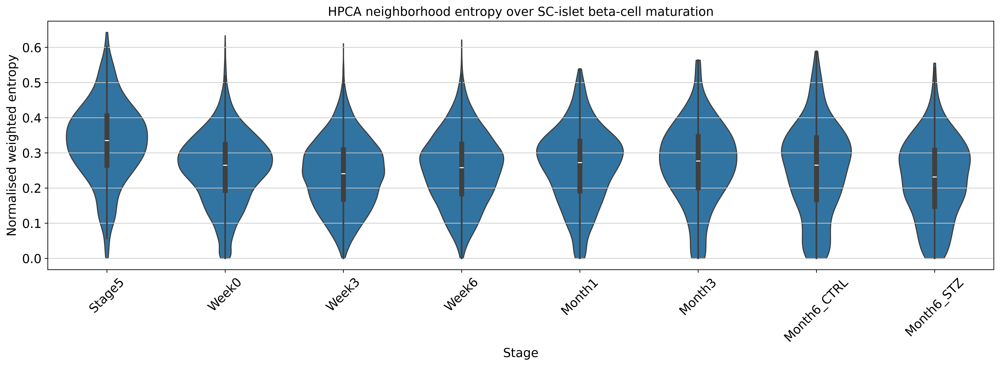

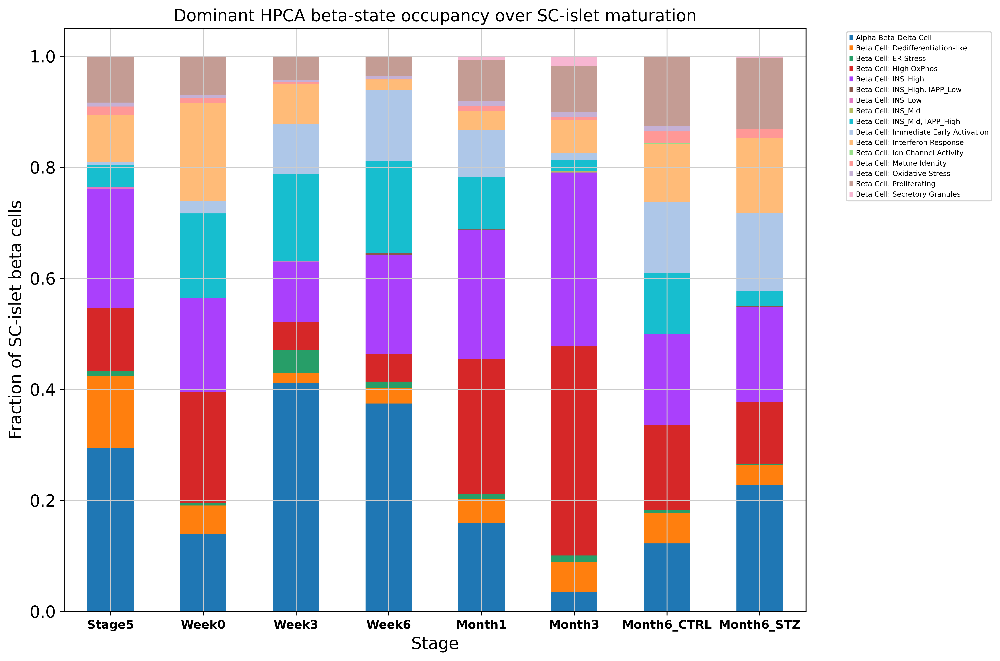

In [12]:

sc_beta = beta_cells[
    (beta_cells.obs[SOURCE_COL] == QUERY_LABEL)
    & (beta_cells.obs['dominant_human_state'].str.contains("Beta", case=False, na=False))
].copy()

present_order = [s for s in STAGE_ORDER if s in sc_beta.obs[STAGE_COL].unique()]

# ---- First Plot: Violinplot ----
fig1, ax1 = plt.subplots(figsize=(16, 6), dpi=300)
sns.violinplot(
    data=sc_beta.obs,
    x=STAGE_COL,
    y="weighted_entropy",
    order=present_order,
    cut=0,
    ax=ax1,
)
ax1.set_title("HPCA neighborhood entropy over SC-islet beta-cell maturation")
ax1.set_ylabel("Normalised weighted entropy")
ax1.tick_params(axis="x", rotation=45)
fig1.tight_layout()
fig1.savefig("fig1_entropy_violin.svg", bbox_inches="tight", dpi=300)
plt.show()

# ---- Second Plot: Stacked Bar ----
tp_state = (
    sc_beta.obs
    .groupby([STAGE_COL, "dominant_human_state"])
    .size()
    .unstack(fill_value=0)
)
tp_state_norm = tp_state.div(tp_state.sum(axis=1), axis=0)

fig2, ax2 = plt.subplots(figsize=(12, 8), dpi=300)
tp_state_norm.loc[present_order].plot(
    kind="bar",
    stacked=True,
    ax=ax2,
)
ax2.set_title("Dominant HPCA beta-state occupancy over SC-islet maturation")
ax2.set_ylabel("Fraction of SC-islet beta cells")
# 'fontsize' and 'fontweight' are not valid arguments for tick_params; set them via set_xticklabels
ax2.tick_params(axis="x", rotation=0)
for label in ax2.get_xticklabels():
    label.set_fontsize(10)
    label.set_fontweight("bold")
ax2.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=6)
fig2.tight_layout()
fig2.savefig("fig1_state_occupancy_bar.svg", bbox_inches="tight", dpi=300)
plt.show()

tp_state.to_csv("dominant_state_counts_by_stage.csv")
tp_state_norm.to_csv("dominant_state_fraction_by_stage.csv")

In [17]:
import os
os.chdir('workspace/hpca/hpca_downstream/HSC_Islets_Results/')

Core beta reference  : 87223
SC-islet beta query  : 20816


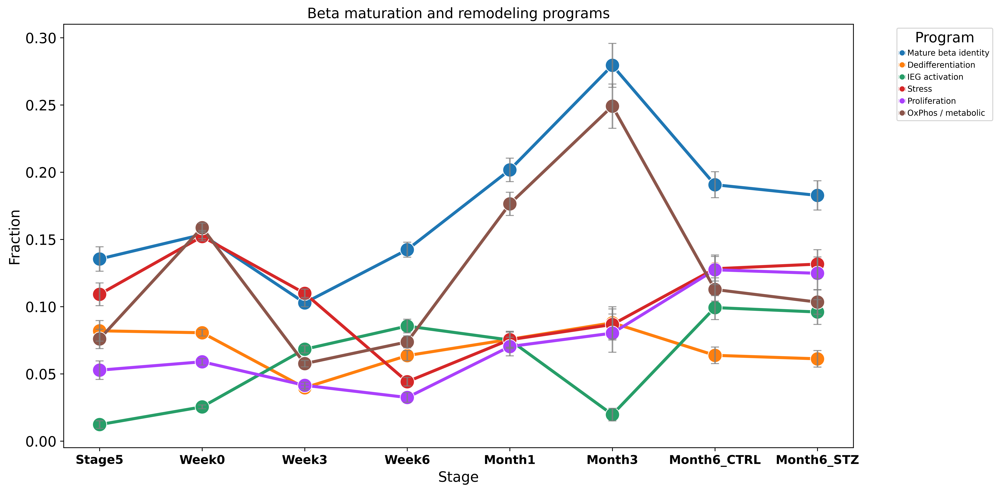

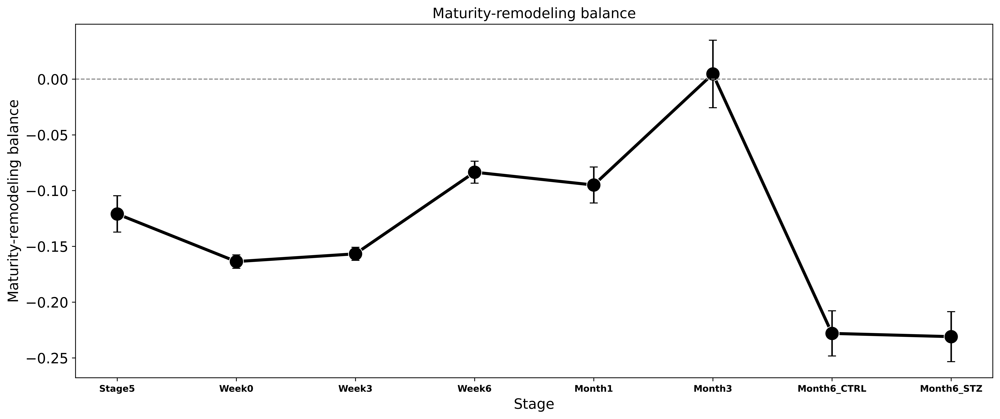

In [18]:
adata = hsc_islets
core_mask = adata.obs[SOURCE_COL].eq(CORE_LABEL)
query_mask = (
    adata.obs[SOURCE_COL].eq(QUERY_LABEL) &
    adata.obs[STAGE_COL].notna()
)
core_beta_mask = (
    core_mask &
    adata.obs[STATE_COL].astype(str).str.contains("Beta", case=False, na=False)
)
query_beta_mask = query_mask & adata.obs['dominant_human_state'].str.contains("Beta", case=False, na=False)

print(f"Core beta reference  : {core_beta_mask.sum()}")
print(f"SC-islet beta query  : {query_beta_mask.sum()}")

G = adata.obsp["connectivities"].tocsr()
query_idx = np.where(query_beta_mask)[0]
core_beta_idx = np.where(core_beta_mask)[0]

G_qr = G[query_idx, :][:, core_beta_idx].tocsr()
row_sums = np.asarray(G_qr.sum(axis=1)).ravel()
row_sums[row_sums == 0] = 1
G_qr_norm = sparse.diags(1 / row_sums) @ G_qr

core_states = adata.obs.iloc[core_beta_idx][STATE_COL].astype(str).to_numpy()
all_beta_states = sorted(pd.unique(core_states))

def match_states(include, exclude=None):
    if isinstance(include, str):
        include = [include]
    exclude = exclude or []
    if isinstance(exclude, str):
        exclude = [exclude]
    return [
        s for s in all_beta_states
        if any(x.lower() in s.lower() for x in include)
        and not any(x.lower() in s.lower() for x in exclude)
    ]

# Beta-specific programs
programs = {
    "Mature beta identity": [
        "Beta Cell: INS_High", "Beta Cell: Mature Identity", "Beta Cell: Secretory Granules"
    ],
    "INS_Mid IAPP_High": ["Beta Cell: INS_Mid, IAPP_High"],
    "Dedifferentiation": match_states(["Dedifferentiation"]),
    "IEG activation": ["Beta Cell: Immediate Early Activation"],
    "Stress": match_states(["Interferon", "Oxidative Stress", "ER Stress"]),
    "Proliferation": match_states(["Proliferating"]),
    "OxPhos / metabolic": match_states(["High OxPhos"]),
}

score_df = pd.DataFrame(index=adata.obs_names[query_idx])
for name, states in programs.items():
    valid = [s for s in states if s in all_beta_states]
    col_mask = np.isin(core_states, valid)
    score_df[name] = (
        np.asarray(G_qr_norm[:, col_mask].sum(axis=1)).ravel()
        if col_mask.sum() > 0 else 0.0
    )

score_df[STAGE_COL] = adata.obs.iloc[query_idx][STAGE_COL].values

score_df["Remodeling / plasticity"] = (
    score_df["Dedifferentiation"] + score_df["IEG activation"] +
    score_df["Stress"] + score_df["Proliferation"]
)
score_df["Maturity-remodeling balance"] = (
    score_df["Mature beta identity"] - score_df["Remodeling / plasticity"]
)

program_cols = list(programs.keys())
# Mean summary by stage
stage_mean = (
    score_df.groupby(STAGE_COL)[
        program_cols + ["Remodeling / plasticity", "Maturity-remodeling balance"]
    ]
    .mean()
    .reindex([s for s in STAGE_ORDER if s in score_df[STAGE_COL].unique()])
)

stage_sem = (
    score_df.groupby(STAGE_COL)[
        program_cols + ["Remodeling / plasticity", "Maturity-remodeling balance"]
    ]
    .sem()
    .reindex(stage_mean.index)
)

# Define remodeling columns
remodeling_cols = [
    "Dedifferentiation",
    "IEG activation",
    "Stress",
    "Proliferation",
    "OxPhos / metabolic",
]

all_program_cols = ["Mature beta identity"] + remodeling_cols

# Long-format dataframe for lineplot
stage_allprograms_melt = (
    stage_mean[all_program_cols]
    .reset_index()
    .melt(id_vars=STAGE_COL, var_name="Program", value_name="Fraction")
)

fig, ax = plt.subplots(1, 1, figsize=(14, 7), dpi=300)

sns.lineplot(
    data=stage_allprograms_melt,
    x=STAGE_COL,
    y="Fraction",
    hue="Program",
    marker="o",
    ax=ax,
    linewidth=3,
    markersize=14,
    errorbar=None
)

x_positions = np.arange(len(stage_mean.index))

for program in all_program_cols:
    ax.errorbar(
        x=x_positions,
        y=stage_mean[program].values,
        yerr=stage_sem[program].values,
        fmt="none",
        capsize=4,
        elinewidth=1.5,
        alpha=0.8,
        color="grey"
    )

ax.set_title("Beta maturation and remodeling programs")
ax.set_xticks(x_positions)
ax.set_xticklabels(stage_mean.index)
ax.tick_params(axis="x", rotation=0)

for label in ax.get_xticklabels():
    label.set_fontsize(12)
    label.set_fontweight("bold")

leg = ax.legend(
    fontsize=8,
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    title="Program"
)

import matplotlib

legend_handles = []
if hasattr(leg, "legend_handles") and leg.legend_handles is not None:
    legend_handles = leg.legend_handles
elif hasattr(leg, "legend_handles_original"):
    legend_handles = leg.legend_handles_original
else:
    label_to_handle = dict(zip(*ax.get_legend_handles_labels()))
    legend_handles = [
        label_to_handle.get(text.get_text())
        for text in leg.get_texts()
        if text.get_text() in label_to_handle
    ]

for handle in legend_handles:
    if isinstance(handle, matplotlib.lines.Line2D):
        handle.set_markersize(6)
    elif hasattr(handle, "set_sizes"):
        handle.set_sizes([36])

ax.grid(False)
plt.tight_layout()
fig.savefig("all_programs_combined_mean.svg", dpi=300, bbox_inches="tight")
plt.show()


# — balance: mean + IQR —
fig_bal, ax_bal = plt.subplots(1, 1, figsize=(14, 6), dpi=300)

sns.lineplot(
    data=stage_mean.reset_index(),
    x=STAGE_COL,
    y="Maturity-remodeling balance",
    marker="o",
    ax=ax_bal,
    color="black",
    linewidth=3,
    markersize=14,
    errorbar=None
)

y_bal = stage_mean["Maturity-remodeling balance"].values
lower_bal = y_bal - stage_q25["Maturity-remodeling balance"].values
upper_bal = stage_q75["Maturity-remodeling balance"].values - y_bal



ax_bal.errorbar(
    x=x_positions,
    y=stage_mean["Maturity-remodeling balance"].values,
    yerr=stage_sem["Maturity-remodeling balance"].values,
    fmt="none",
    capsize=4,
    elinewidth=1.5,
    color="black"
)

ax_bal.axhline(0, linestyle="--", linewidth=1, color="grey")
ax_bal.set_title("Maturity-remodeling balance")
ax_bal.set_xticks(x_positions)
ax_bal.set_xticklabels(stage_mean.index)
ax_bal.tick_params(axis="x", rotation=0)

for label in ax_bal.get_xticklabels():
    label.set_fontsize(9)
    label.set_fontweight("bold")

ax_bal.grid(False)
plt.tight_layout()
fig_bal.savefig(
    "maturity_remodeling_balance_mean.svg",
    dpi=300,
    bbox_inches="tight"
)
plt.show()

In [9]:
hsc_islets.obs.Stage.value_counts()

Stage
nan            815126
Week0           11148
Week3           10181
Month3           6358
Week6            4535
Month1           3788
Month6_STZ       2858
Stage5           2743
Month6_CTRL      2179
Name: count, dtype: int64

In [27]:
score_df.to_csv(os.path.join(OUTDIR, "score_df.csv"))
score_df.head()

,Mature beta identity,INS_Mid IAPP_High,Dedifferentiation,IEG activation,Stress,Proliferation,OxPhos / metabolic,Stage,Remodeling / plasticity,Maturity-remodeling balance
GSM5114459_AAACGGGTCAACACAC,0.000000,0.132529,0.000000,0.0,0.000000,0.0,0.000000,Stage5,0.000000,0.000000
GSM5114459_AAAGATGGTCATATGC,0.000000,0.000000,0.000000,0.0,0.000000,1.0,0.000000,Stage5,1.000000,-1.000000
GSM5114459_AAAGCAACAATCTACG,0.513425,0.000000,0.000000,0.0,0.486576,0.0,0.000000,Stage5,0.486576,0.026849
GSM5114459_AAAGTAGAGGGCTTCC,1.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,Stage5,0.000000,1.000000
GSM5114459_AAATGCCCACAGGCCT,0.346158,0.000000,0.262121,0.0,0.000000,0.0,0.391721,Stage5,0.262121,0.084038


In [28]:
!pip install pydeseq2


[notice] A new release of pip is available: 26.0.1 -> 26.1.1
[notice] To update, run: pip install --upgrade pip


# Build Centroid Manifold

In [20]:
from statsmodels.stats.multitest import multipletests
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from tqdm import tqdm



def drop_technical_genes(adata):
    keep = [
        g for g in adata.var_names
        if not g.upper().startswith(DROP_PREFIXES)
    ]
    return adata[:, keep].copy()


human_beta = hsc_islets[
    (hsc_islets.obs[SOURCE_COL] == CORE_LABEL) &
    (hsc_islets.obs[STATE_COL].str.contains("Beta", case=False, na=False))
].copy()

print("Human beta:", human_beta.shape)
print("SC beta:", sc_beta.shape)


Human beta: (87223, 25785)
SC beta: (20816, 25785)


In [21]:
mature_human_beta = beta_cells[
    (beta_cells.obs[SOURCE_COL] == CORE_LABEL) &
    (beta_cells.obs[STATE_COL].isin(MATURE_BETA_STATES))
].copy()

mature_centroid = np.median(
    mature_human_beta.obsm[REP_KEY],
    axis=0
)

beta_cells.obs["adult_beta_attractor_distance"] = cdist(
    beta_cells.obsm[REP_KEY],
    mature_centroid[None, :],
    metric="cosine"
).ravel()

beta_cells.obs["adult_beta_fidelity"] = (
    1 - beta_cells.obs["adult_beta_attractor_distance"]
)

sc_beta = beta_cells[
    beta_cells.obs[SOURCE_COL] == QUERY_LABEL
].copy()

human_beta = beta_cells[
    beta_cells.obs[SOURCE_COL] == CORE_LABEL
].copy()

,mean,std,count
Stage,,,
Stage5,0.696089,0.137247,968
Week0,0.491022,0.123221,8554
Week3,0.462130,0.132823,6250
Week6,0.421959,0.111716,2025
Month1,0.445242,0.127594,1211
Month3,0.447304,0.138281,348
Month6_CTRL,0.417035,0.155290,810
Month6_STZ,0.423971,0.143067,650


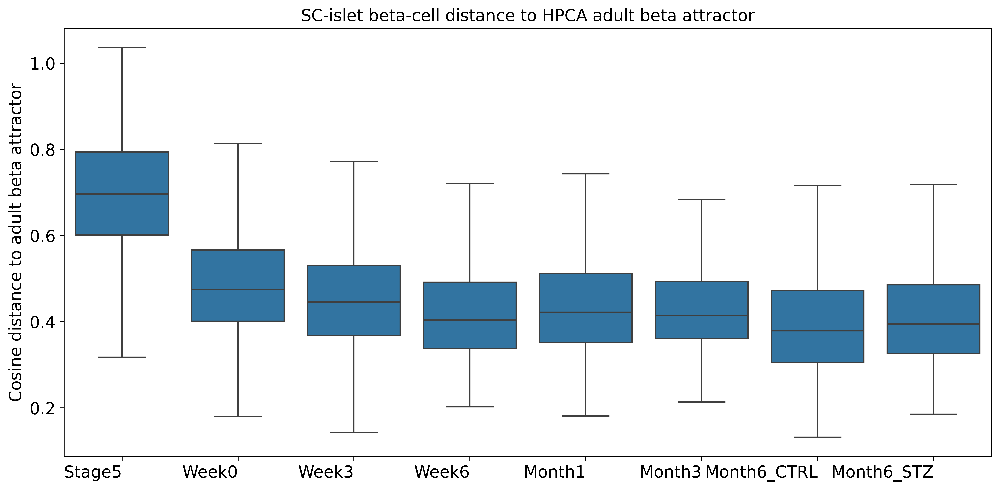

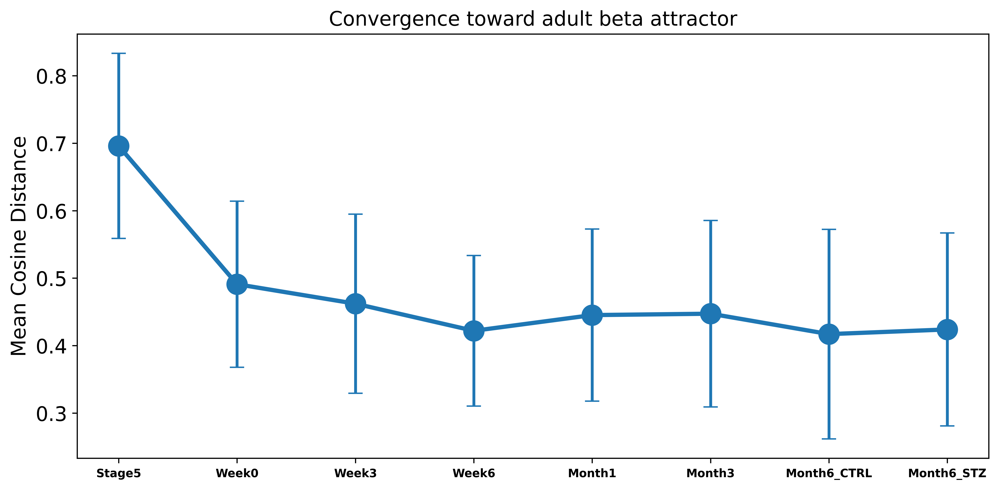

In [30]:
stage_dist = (
    sc_beta.obs
    .groupby(STAGE_COL)["adult_beta_attractor_distance"]
    .agg(["mean", "std", "count"])
    .reindex([s for s in STAGE_ORDER if s in sc_beta.obs[STAGE_COL].unique()])
)
display(stage_dist)

fig1 = plt.figure(figsize=(12, 6), dpi=300)
sns.boxplot(
    data=sc_beta.obs,
    x=STAGE_COL,
    y="adult_beta_attractor_distance",
    order=stage_dist.index,
    showfliers=False,
)
plt.xticks(rotation=0, ha="right")
plt.ylabel("Cosine distance to adult beta attractor")
plt.xlabel("")
plt.title("SC-islet beta-cell distance to HPCA adult beta attractor")
plt.tight_layout()
plt.grid(False)
plt.savefig("sc_beta_distance_to_adult_attractor_boxplot.svg", dpi=300)
plt.show()

fig2 = plt.figure(figsize=(10, 5), dpi=300)
plt.errorbar(
    x=stage_dist.index,
    y=stage_dist["mean"],
    yerr=stage_dist["std"],
    fmt='o-',  # Line with circle marker
    linewidth=3,
    markersize=14,
    capsize=5,
    elinewidth=2,
)
plt.xticks(rotation=0, ha="center", fontsize=8, fontweight="bold")
plt.ylabel("Mean Cosine Distance")
plt.xlabel("")
plt.title("Convergence toward adult beta attractor")
plt.tight_layout()
plt.grid(False)
plt.savefig("sc_beta_distance_to_adult_attractor_line.svg", dpi=300)
plt.show()

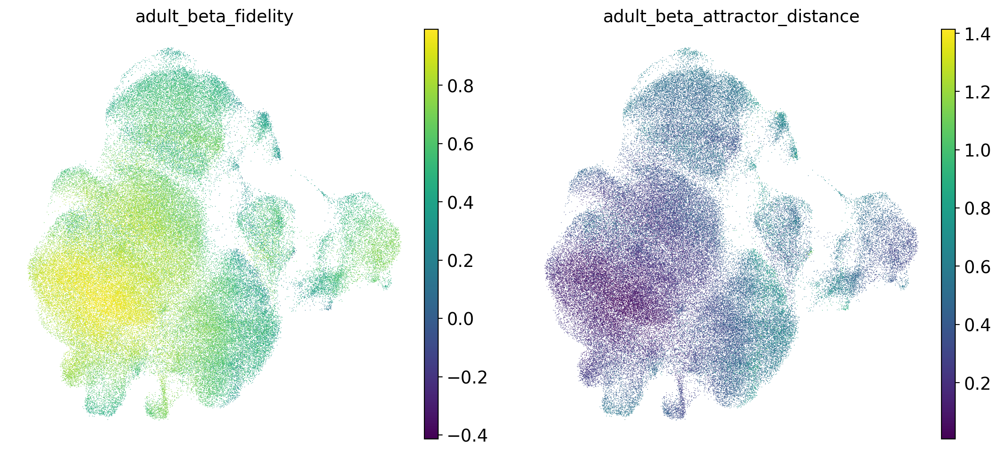

In [32]:
sc.pp.neighbors(beta_cells, use_rep=REP_KEY, metric="cosine", n_neighbors=100)
sc.tl.umap(beta_cells)
sc.tl.diffmap(beta_cells)
sc.pl.umap(beta_cells, color=["adult_beta_fidelity", "adult_beta_attractor_distance"])

In [33]:
import os
os.chdir(OUTDIR)

In [ ]:
pwd

'/workspace/hpca/hpca_downstream/HSC_Islets_Results'

In [47]:
beta_cells.obs.source.value_counts()

source
core                   87223
GSE167880_extension    20816
Name: count, dtype: int64

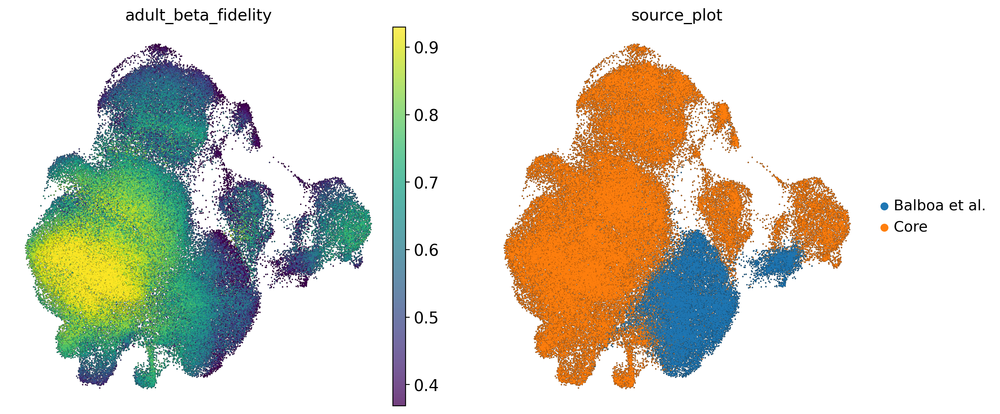

In [54]:
# Rename 'source' values: 'core' -> 'Core', 'GSE167880_extension' -> 'Balboa et al.'
beta_cells.obs["source_plot"] = beta_cells.obs["source"].replace({"core": "Core", "GSE167880_extension": "Balboa et al."})

sc.pl.umap(
    beta_cells,
    color=["adult_beta_fidelity", "source_plot"],
    size=5,
    sort_order=True,
    groups=None,
    add_outline=True,
    frameon=False,
    outline_width=(0.1, 0.05),
    outline_color=["white", "black"],
    na_color="lightgray",
    alpha=0.75,
    na_in_legend=False,
    vmax='p95', vmin='p5',
    save="beta_cells_centroid_distance.svg"
)

In [ ]:
sc.pl.umap(
    beta_cells,
    color=["adult_beta_fidelity"],
    size=5,
    sort_order=True,
    groups=None,
    add_outline=True,
    frameon=False,
    outline_width=(0.1, 0.05),
    outline_color=["white", "black"],
    na_color="lightgray",
    alpha=0.75,
    na_in_legend=False,
    vmax='p95', vmin='p5',
    save="beta_cells_centroid_distance.svg"
)

In [59]:
beta_cells.X.max()

np.float32(135974.0)

In [36]:
from scipy.stats import spearmanr

In [37]:
from scipy import sparse
from scipy.stats import rankdata
from statsmodels.stats.multitest import multipletests
from scipy.stats import t as t_dist

human_beta_expr = human_beta.copy()
sc.pp.normalize_total(human_beta_expr, target_sum=1e6)
sc.pp.log1p(human_beta_expr)
sc.pp.filter_genes(human_beta_expr, min_cells=5)
human_beta_expr = drop_technical_genes(human_beta_expr)

fidelity = human_beta.obs.loc[
    human_beta_expr.obs_names,
    "adult_beta_fidelity"
].values.astype(float)

X = human_beta_expr.X
if sparse.issparse(X):
    X = X.toarray()   # OK if human_beta is not massive; otherwise see note below
else:
    X = np.asarray(X)

genes = np.asarray(human_beta_expr.var_names)

# filter genes expressed in at least 5% cells
expr_frac = (X > 0).mean(axis=0)
keep = expr_frac >= 0.05

X = X[:, keep]
genes = genes[keep]
expr_frac = expr_frac[keep]
mean_expr = X.mean(axis=0)

# remove cells with nan fidelity
valid_cells = np.isfinite(fidelity)
X = X[valid_cells, :]
fidelity = fidelity[valid_cells]

# rank-transform
fidelity_rank = rankdata(fidelity)
X_rank = np.apply_along_axis(rankdata, 0, X)

# Pearson correlation on ranks = Spearman
fidelity_rank = fidelity_rank - fidelity_rank.mean()
X_rank = X_rank - X_rank.mean(axis=0)

rho = (
    fidelity_rank @ X_rank
) / (
    np.sqrt(np.sum(fidelity_rank ** 2)) *
    np.sqrt(np.sum(X_rank ** 2, axis=0))
)

# p-values from t approximation
n = len(fidelity)
t_stat = rho * np.sqrt((n - 2) / np.clip(1 - rho**2, 1e-12, None))
pvals = 2 * t_dist.sf(np.abs(t_stat), df=n - 2)

padj = multipletests(pvals, method="fdr_bh")[1]

attractor_gene_df = pd.DataFrame({
    "gene": genes,
    "rho_adult_fidelity": rho,
    "pval": pvals,
    "padj": padj,
    "expr_frac_human_beta": expr_frac,
    "mean_expr_human_beta": mean_expr,
}).sort_values(["padj", "rho_adult_fidelity"], ascending=[True, False])

adult_fidelity_genes = (
    attractor_gene_df[
        (attractor_gene_df["padj"] < 0.05) &
        (attractor_gene_df["rho_adult_fidelity"] > 0.15)
    ]
    .sort_values("rho_adult_fidelity", ascending=False)
)

peripheral_genes = (
    attractor_gene_df[
        (attractor_gene_df["padj"] < 0.05) &
        (attractor_gene_df["rho_adult_fidelity"] < -0.15)
    ]
    .sort_values("rho_adult_fidelity", ascending=True)
)

# Removed OUTDIR from path since cwd is already changed
attractor_gene_df.to_csv("human_beta_attractor_genes.csv", index=False)
adult_fidelity_genes.to_csv("adult_fidelity_positive_genes.csv", index=False)
peripheral_genes.to_csv("adult_fidelity_negative_peripheral_genes.csv", index=False)

print("Top adult fidelity genes:")
display(adult_fidelity_genes.head(50))

print("Top peripheral / non-attractor genes:")
display(peripheral_genes.head(50))

Top adult fidelity genes:


,gene,rho_adult_fidelity,pval,padj,expr_frac_human_beta,mean_expr_human_beta
3964,INS,0.625441,0.0,0.0,0.979799,11.845898
8386,SSR4,0.479364,0.0,0.0,0.843298,5.781666
6059,PCSK1N,0.472975,0.0,0.0,0.872866,6.635743
7545,SCG5,0.469264,0.0,0.0,0.932518,6.872019
1587,CIRBP,0.447579,0.0,0.0,0.845855,5.449562
6167,PFDN5,0.430120,0.0,0.0,0.816195,5.302930
5349,NACA,0.404752,0.0,0.0,0.826089,5.460913
2542,EIF1,0.402390,0.0,0.0,0.871490,6.210098
6130,PEBP1,0.388671,0.0,0.0,0.855898,5.484284
6145,PERP,0.384255,0.0,0.0,0.732490,4.192253


Top peripheral / non-attractor genes:


,gene,rho_adult_fidelity,pval,padj,expr_frac_human_beta,mean_expr_human_beta
7232,RIMS2,-0.452901,0.0,0.0,0.541531,3.294450
6083,PDE4D,-0.442458,0.0,0.0,0.413182,2.560968
198,AGBL4,-0.440955,0.0,0.0,0.359148,2.302571
1100,CACNB2,-0.430415,0.0,0.0,0.363264,2.174569
7595,SDK1,-0.429427,0.0,0.0,0.398232,2.454787
1094,CACNA1C,-0.421141,0.0,0.0,0.404985,2.420812
1301,CCSER1,-0.418113,0.0,0.0,0.347695,2.161220
4131,KCNB2,-0.417173,0.0,0.0,0.390035,2.417119
3137,FTX,-0.416237,0.0,0.0,0.488266,2.937052
5607,NLGN1,-0.416148,0.0,0.0,0.338764,2.019566


In [38]:
top_n = 50

adult_fidelity_gene_list = [
    "INS", "SCG5", "PCSK1N", "SSR4", "SEC11C",
    "GPX4", "HINT2", "SLC25A3", "CIRBP", "PRDX1",
    "PEBP1", "COX4I1", "NDUFC2", "NENF", "ATP6V0B"
]
peripheral_gene_list = [
    "RIMS2", "PDE4D", "CACNB2", "NLGN1", "KCNB2",
    "CACNA1C", "RGS7", "SOX5", "CACNA1D", "GPHN",
    "NBEA", "DPP6", "NRXN1", "TRPM3", "RIMBP2"
]
print(len(peripheral_gene_list))
print(len(adult_fidelity_gene_list))
sc_beta_score = sc_beta.copy()
sc.pp.normalize_total(sc_beta_score, target_sum=1e6)
sc.pp.log1p(sc_beta_score)

adult_fidelity_gene_list = [
    g for g in adult_fidelity_gene_list
    if g in sc_beta_score.var_names
]

peripheral_gene_list = [
    g for g in peripheral_gene_list
    if g in sc_beta_score.var_names
]

sc.tl.score_genes(
    sc_beta_score,
    gene_list=adult_fidelity_gene_list,
    score_name="adult_fidelity_gene_score",
    use_raw=False
)

sc.tl.score_genes(
    sc_beta_score,
    gene_list=peripheral_gene_list,
    score_name="peripheral_gene_score",
    use_raw=False
)

sc_beta_score.obs["adult_beta_attractor_distance"] = sc_beta.obs["adult_beta_attractor_distance"].values
sc_beta_score.obs["adult_beta_fidelity"] = sc_beta.obs["adult_beta_fidelity"].values

stage_score_summary = (
    sc_beta_score.obs
    .groupby(STAGE_COL)[
        [
            "adult_beta_attractor_distance",
            "adult_beta_fidelity",
            "adult_fidelity_gene_score",
            "peripheral_gene_score"
        ]
    ]
    .mean()
    .reindex([s for s in STAGE_ORDER if s in sc_beta_score.obs[STAGE_COL].unique()])
)

display(stage_score_summary)

stage_score_summary.to_csv("sc_beta_attractor_score_by_stage.csv")



15
15


,adult_beta_attractor_distance,adult_beta_fidelity,adult_fidelity_gene_score,peripheral_gene_score
Stage,,,,
Stage5,0.696089,0.303911,1.772079,-0.277239
Week0,0.491022,0.508978,2.371853,-0.083008
Week3,0.462130,0.537870,2.417369,0.220599
Week6,0.421959,0.578041,2.625183,0.053888
Month1,0.445242,0.554758,2.613379,-0.047535
Month3,0.447304,0.552696,2.960622,-0.339901
Month6_CTRL,0.417035,0.582965,2.819901,-0.016226
Month6_STZ,0.423971,0.576029,2.804861,0.055496


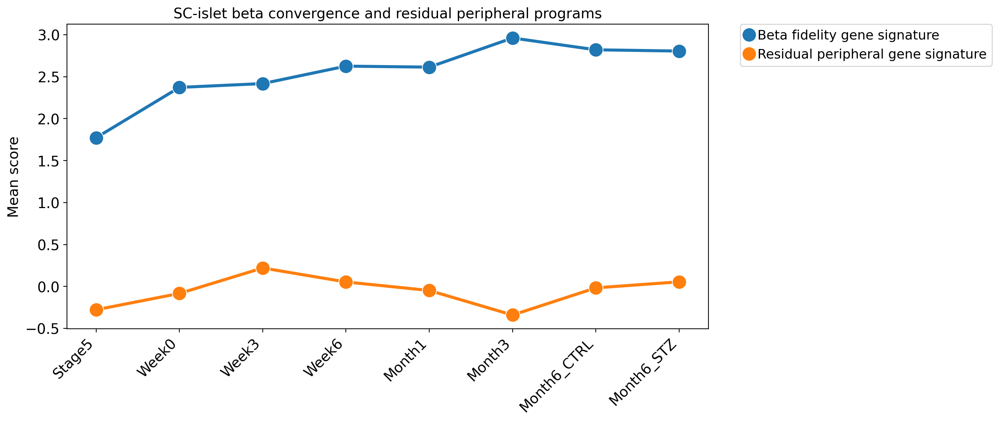

In [39]:
# Define new names for the three scores
score_name_map = {
    # "adult_beta_fidelity": "Beta attractor fidelity",
    "adult_fidelity_gene_score": "Beta fidelity gene signature",
    "peripheral_gene_score": "Residual peripheral gene signature"
}

plot_df = (
    stage_score_summary
    .reset_index()
    .melt(
        id_vars=STAGE_COL,
        value_vars=[
            # "adult_beta_fidelity",
            "adult_fidelity_gene_score",
            "peripheral_gene_score"
        ],
        var_name="score",
        value_name="value"
    )
)

# Change score names to new names
plot_df["score"] = plot_df["score"].map(score_name_map)

plt.figure(figsize=(10, 6))
sns.lineplot(
    data=plot_df,
    x=STAGE_COL,
    y="value",
    hue="score",
    marker="o",
    linewidth=3,  # Make line thicker
    markersize=14  # Make marker big
)
plt.xticks(rotation=45, ha="right")
plt.xlabel("")
plt.ylabel("Mean score")
plt.title("SC-islet beta convergence and residual peripheral programs")
plt.tight_layout()
plt.grid(False)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.savefig("sc_beta_attractor_program_scores.svg", dpi=300)
plt.show()

In [40]:
plot_df

,Stage,score,value
0,Stage5,Beta fidelity gene signature,1.772079
1,Week0,Beta fidelity gene signature,2.371853
2,Week3,Beta fidelity gene signature,2.417369
3,Week6,Beta fidelity gene signature,2.625183
4,Month1,Beta fidelity gene signature,2.613379
5,Month3,Beta fidelity gene signature,2.960622
6,Month6_CTRL,Beta fidelity gene signature,2.819901
7,Month6_STZ,Beta fidelity gene signature,2.804861
8,Stage5,Residual peripheral gene signature,-0.277239
9,Week0,Residual peripheral gene signature,-0.083008


In [41]:
late_sc_beta = sc_beta_score[
    sc_beta_score.obs[STAGE_COL].isin(["Month3", "Month6_CTRL"])
].copy()

early_sc_beta = sc_beta_score[
    sc_beta_score.obs[STAGE_COL].isin(["Stage5", "Week0"])
].copy()

human_mature_expr = mature_human_beta.copy()
sc.pp.normalize_total(human_mature_expr, target_sum=1e6)
sc.pp.log1p(human_mature_expr)

shared_genes = [
    g for g in adult_fidelity_gene_list
    if g in human_mature_expr.var_names
    and g in late_sc_beta.var_names
    and g in early_sc_beta.var_names
]


def mean_expr(adata, genes):
    x = adata[:, genes].X
    if sparse.issparse(x):
        return np.asarray(x.mean(axis=0)).ravel()
    return np.asarray(x.mean(axis=0)).ravel()


adult_mean = mean_expr(human_mature_expr, shared_genes)
late_mean = mean_expr(late_sc_beta, shared_genes)
early_mean = mean_expr(early_sc_beta, shared_genes)

fidelity_gene_comparison = pd.DataFrame({
    "gene": shared_genes,
    "adult_mature_beta_mean": adult_mean,
    "late_sc_beta_mean": late_mean,
    "early_sc_beta_mean": early_mean,
})

fidelity_gene_comparison["late_minus_early"] = (
    fidelity_gene_comparison["late_sc_beta_mean"]
    - fidelity_gene_comparison["early_sc_beta_mean"]
)

fidelity_gene_comparison["adult_minus_late"] = (
    fidelity_gene_comparison["adult_mature_beta_mean"]
    - fidelity_gene_comparison["late_sc_beta_mean"]
)

fidelity_gene_comparison["convergence_ratio"] = (
    fidelity_gene_comparison["late_minus_early"]
    / (
        fidelity_gene_comparison["adult_mature_beta_mean"]
        - fidelity_gene_comparison["early_sc_beta_mean"]
    ).replace(0, np.nan)
)

fidelity_gene_comparison = fidelity_gene_comparison.sort_values(
    "adult_minus_late",
    ascending=False
)

# Removed OUTDIR; write to current directory instead
fidelity_gene_comparison.to_csv(
    "adult_fidelity_genes_sc_convergence_gap.csv",
    index=False
)

fidelity_gene_comparison

,gene,adult_mature_beta_mean,late_sc_beta_mean,early_sc_beta_mean,late_minus_early,adult_minus_late,convergence_ratio
6,HINT2,3.130800,0.900653,0.830753,0.069900,2.230146,0.030391
0,INS,12.806466,11.668612,9.587209,2.081403,1.137855,0.646547
1,SCG5,7.446068,6.500112,6.022369,0.477743,0.945956,0.335565
8,CIRBP,6.206444,5.680893,5.424212,0.256682,0.525550,0.328140
4,SEC11C,6.128738,5.937879,4.648419,1.289460,0.190859,0.871069
5,GPX4,5.619804,5.440334,5.500070,-0.059735,0.179470,-0.498899
14,ATP6V0B,5.262767,5.103570,5.110441,-0.006871,0.159196,-0.045106
3,SSR4,6.673284,6.632905,6.279842,0.353064,0.040378,0.897372
9,PRDX1,4.180222,4.209284,3.318503,0.890782,-0.029062,1.033726
13,NENF,4.796856,4.894853,3.962126,0.932727,-0.097997,1.117399


In [60]:
heatmap_df.T

,Stage5,Week0,Week3,Week6,Month1,Month3,Month6_CTRL,Month6_STZ,Human Beta
HINT2,0.389296,0.880710,0.817769,0.861484,1.156082,1.201941,0.771211,0.816491,3.130800
INS,6.853489,9.896552,11.417293,11.673021,11.135388,11.617391,11.690607,12.018415,12.806466
SCG5,4.459971,6.199161,6.966889,7.329983,6.028892,6.307956,6.582667,7.138489,7.446068
CIRBP,4.185241,5.564413,5.204552,5.318569,5.875496,5.866316,5.601222,5.769497,6.206444
SEC11C,4.647681,4.648518,5.506589,6.202458,4.285874,5.466208,6.140522,6.524487,6.128738
GPX4,3.630081,5.711686,5.851001,6.136249,5.252048,5.139840,5.569429,5.660423,5.619804
ATP6V0B,4.017752,5.234084,5.284424,5.623713,4.620342,4.698424,5.277631,5.379297,5.262767
SSR4,5.647039,6.351462,6.891034,7.021261,6.269640,6.542495,6.671750,6.721722,6.673284
PRDX1,3.739282,3.270888,3.964342,4.347745,2.798567,3.542175,4.495898,4.230289,4.180222
NENF,2.797804,4.093884,4.484265,4.816937,4.644122,4.946203,4.872790,5.066220,4.796856


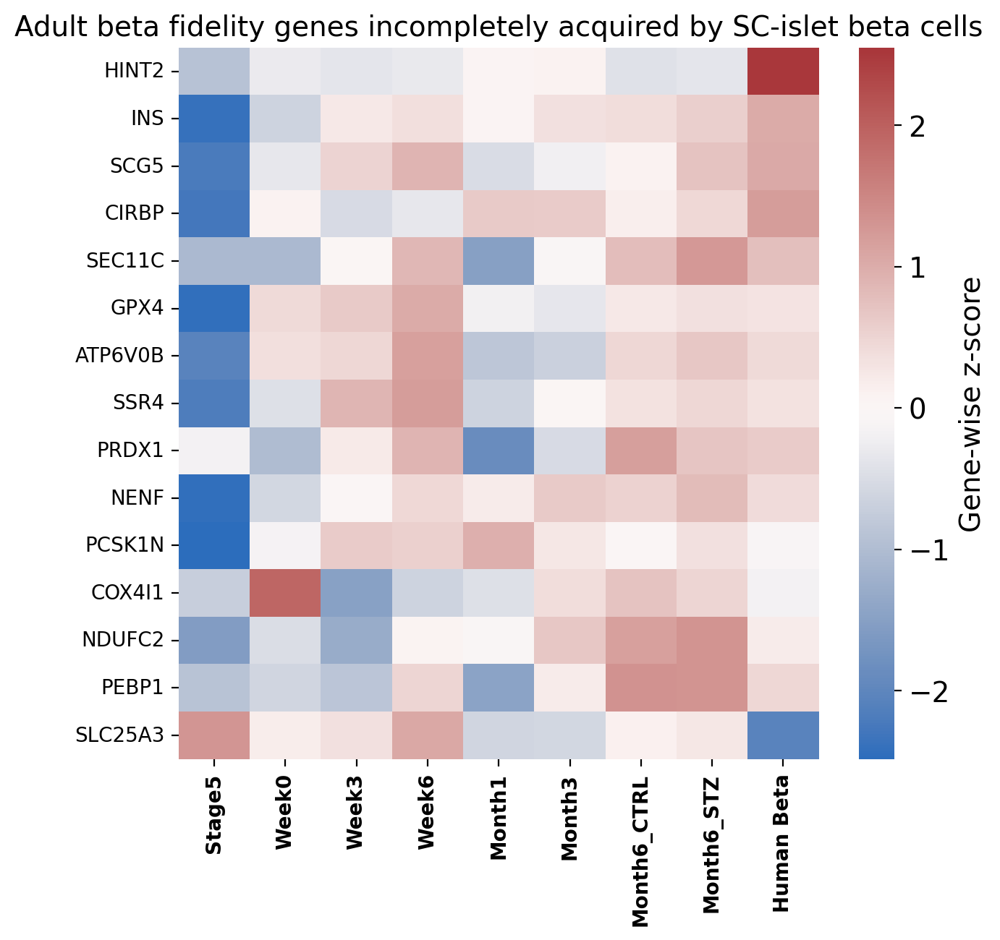

In [43]:
heatmap_genes = (
    fidelity_gene_comparison
    .sort_values("adult_minus_late", ascending=False)
    .head(30)["gene"]
    .tolist()
)

stage_means = []

# Ensure heatmap_genes is unique and preserves order
from collections import OrderedDict
heatmap_genes = list(OrderedDict.fromkeys(heatmap_genes))

for stage in [s for s in STAGE_ORDER if s in sc_beta_score.obs[STAGE_COL].unique()]:
    sub = sc_beta_score[sc_beta_score.obs[STAGE_COL] == stage]
    vals = mean_expr(sub, heatmap_genes)
    # Ensure the gene index is unique
    s_vals = pd.Series(vals, index=heatmap_genes, name=stage)
    s_vals = s_vals[~s_vals.index.duplicated(keep="first")]
    stage_means.append(s_vals)

adult_vals = mean_expr(human_mature_expr, heatmap_genes)
adult_series = pd.Series(adult_vals, index=heatmap_genes, name="Adult human beta")
adult_series = adult_series[~adult_series.index.duplicated(keep="first")]
stage_means.append(adult_series)

# Build DataFrame by rows; transpose so rows are stages, columns are genes
heatmap_df = pd.DataFrame(stage_means)
# Change row label from "Adult human beta" to "Human Beta"
if "Adult human beta" in heatmap_df.index:
    heatmap_df = heatmap_df.rename(index={"Adult human beta": "Human Beta"})

# z-score genes across stages/adult (i.e., z-score each column)
heatmap_z = heatmap_df.apply(
    lambda x: (x - x.mean()) / x.std() if x.std() > 0 else x * 0,
    axis=0
)

plt.figure(figsize=(7, 7))
ax = sns.heatmap(
    heatmap_z.T,
    cmap="vlag",
    center=0,
    cbar_kws={"label": "Gene-wise z-score"}
)
plt.title("Adult beta fidelity genes incompletely acquired by SC-islet beta cells")
plt.xlabel("")
plt.ylabel("")
plt.tight_layout()
plt.grid(False)
# Set xtick rotation, fontsize and bold
ax.set_xticklabels(
    ax.get_xticklabels(), 
    rotation=90, 
    fontsize=10, 
    fontweight='bold'
)
ax.set_yticklabels(
    ax.get_yticklabels(), 
    rotation=0, 
    fontsize=10, 
)
plt.savefig("adult_fidelity_gene_gap_heatmap.svg", dpi=300)
plt.show()

In [57]:
month6_ctrl = beta_cells[
    beta_cells.obs["Stage"] == "Month6_CTRL"
].copy()

adult_mature = beta_cells[
    (beta_cells.obs[SOURCE_COL] == CORE_LABEL) &
    (beta_cells.obs[STATE_COL].isin(MATURE_BETA_STATES))
].copy()

In [ ]:
adata_dge = ad.concat(
    [month6_ctrl, adult_mature]
)
sc.pp.normalize_total(adata_dge, target_sum=1e6)
sc.pp.log1p(adata_dge)

In [70]:
adata_dge.X.max()

np.float32(13.770708)

In [72]:
import re
print(f'Genes before filtering: {len(adata_dge.var_names)}')
sc.pp.filter_genes(adata_dge, min_cells=5)
# Re-apply filter to remove MT, RPL, RPS, HB, LINC and A[X]-type genes after filtering low-abundance genes
bad = (
    adata_dge.var_names.str.startswith(("MT-", "RPL", "RPS", "HB", "LINC"))
    | adata_dge.var_names.str.match(r"^A[A-Z]\d+(\.\d+)?$")
)
adata_dge = adata_dge[:, ~bad].copy()
print(f'Genes after filtering: {len(adata_dge.var_names)}')

Genes before filtering: 25785
Genes after filtering: 19564


In [73]:

adata_dge.obs["group"] = (
    ["Month6_CTRL"] * month6_ctrl.n_obs +
    ["Adult_Mature"] * adult_mature.n_obs
)

sc.tl.rank_genes_groups(
    adata_dge,
    groupby="group",
    groups=["Month6_CTRL"],
    reference="Adult_Mature",
    method="wilcoxon"
)

In [74]:
sc.get.rank_genes_groups_df(adata_dge, group="Month6_CTRL")

,names,scores,logfoldchanges,pvals,pvals_adj
0,H3F3A,48.205738,39.825058,0.0,0.0
1,ATP5MD,47.008080,37.792591,0.0,0.0
2,H3F3B,47.008080,38.161213,0.0,0.0
3,MTRNR2L12,46.349369,38.744518,0.0,0.0
4,C4orf48,45.810421,37.592274,0.0,0.0
...,...,...,...,...,...
19559,ZFAS1,-38.517410,-36.181610,0.0,0.0
19560,WDR83OS,-39.368683,-9.906894,0.0,0.0
19561,SNHG8,-39.465912,-36.427692,0.0,0.0
19562,MEG3,-40.002022,-37.110813,0.0,0.0


In [83]:
pd.DataFrame(adata_dge.uns['rank_genes_groups']['names']).head(30)

,Month6_CTRL
0,H3F3A
1,ATP5MD
2,H3F3B
3,MTRNR2L12
4,C4orf48
5,ATP5MPL
6,MTRNR2L8
7,C9orf16
8,HIST1H4C
9,H2AFY


In [75]:
hsc_islets.obs.groupby('source')['sample_id'].nunique()

source
GSE167880_extension     18
core                   174
Name: sample_id, dtype: int64

In [76]:
hsc_islets[hsc_islets.obs.source == 'core'].obs.Dataset.value_counts().sort_index()

Dataset
GSE84133_remapped                 6727
GSE101207_remapped               14043
GSE114297_remapped               20351
GSE150724                        12327
GSE183568                        49849
GSE198623                        23871
HPAP                             61879
Jimenez                          90622
Karakose                         30014
Tabula_Sapiens                    7345
charite_snRNA                    64361
espace_scRNA_cultured_islets     36943
espace_snRNA_adult_whole        381657
espace_snRNA_frozen_islets       15137
Name: count, dtype: int64

In [77]:
beta_cells.X.max()

np.float32(135974.0)

In [78]:
sc_beta_score.obs.source.value_counts()

source
GSE167880_extension    20816
Name: count, dtype: int64

In [79]:
sc_beta_score.X.max()

np.float32(13.39929)

In [84]:
sc.tl.score_genes(
    sc_beta_score,
    adult_fidelity_gene_list,
    score_name="adult_beta_fidelity_genes_score"
)

In [89]:
pwd

'/workspace/hpca/hpca_downstream/HSC_Islets_Results'

In [91]:
adata[adata.obs.source == 'core'].obs.Dataset.value_counts()

Dataset
espace_snRNA_adult_whole        381657
Jimenez                          90622
charite_snRNA                    64361
HPAP                             61879
GSE183568                        49849
espace_scRNA_cultured_islets     36943
Karakose                         30014
GSE198623                        23871
GSE114297_remapped               20351
espace_snRNA_frozen_islets       15137
GSE101207_remapped               14043
GSE150724                        12327
Tabula_Sapiens                    7345
GSE84133_remapped                 6727
Name: count, dtype: int64

In [92]:
len(adata[adata.obs.source == 'core'].obs.Dataset.unique())

14